# Deep Learning Final Project: Generating Monet Style Paintings using Generative Adversarial Network (GANs)

##Team Members:
David Medina - ID: 88562995 <br>
Jesus Hernandez - ID: 80629917

# What are GANs?
>[Generative Adversarial Networks](https://arxiv.org/abs/1406.2661) (GANs) are one of the most interesting ideas in computer science today. Two models are trained simultaneously by an adversarial process. A *generator* ("the artist") learns to create images that look real, while a *discriminator* ("the art critic") learns to tell real images apart from fakes.



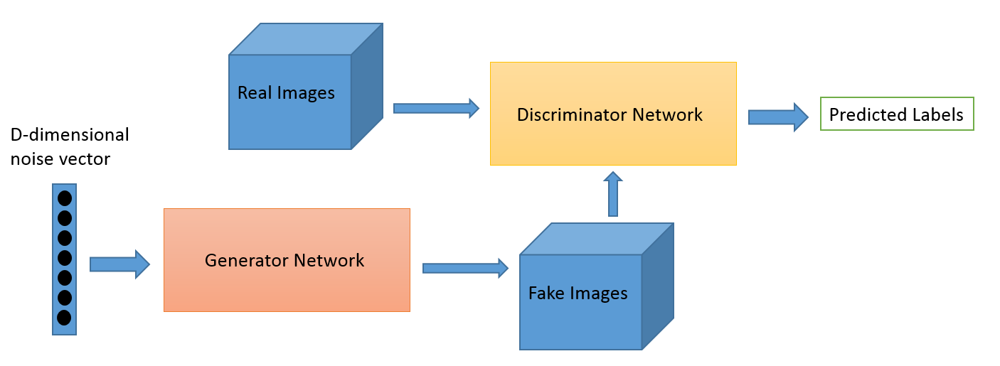

## Objective

Computer vision has advanced tremendously in recent years and GANs are now capable of mimicking objects in a very convincing way. But creating museum-worthy masterpieces is thought of to be, well, more art than science. So can (data) science, in the form of GANs, trick classifiers into believing we’ve created a true Monet? That’s the challenge and main focus for this project.

The dataset that was decided upon for this project is coming from the Kaggle competition: **I'm Something of a Painter Myself**. <br>

The main objective at hand is that of generating Monet style paintings using a GAN, with the second one being using CycleGAN to try and apply Monet-style to normal photos, trying various techniques to enhance the quality of the output.

Link to the Kaggle competition: https://www.kaggle.com/competitions/gan-getting-started/overview

![](https://drive.google.com/uc?export=view&id=1CSwGoQbxaeX4x8LJ0Q9Kk7hfX9VBVhU3)

## Loading the Dataset and Setting up the Notebook

To load a dataset from kaggle it is necessary to have and API token. To obtain one, register to kaggle and go to account, there the option to create a new API token will appear. Once it has been created simply upload it to the files of this google colab notebook.

In [ ]:
# Importing all of the libraries we'll use below
from google.colab import files
import tensorflow as tf
from tensorflow import keras
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
import math
import random
import cv2
from IPython import display
import tensorflow_docs.vis.embed as embed

ModuleNotFoundError: ignored

In [ ]:
# Installing additional libraries to generate GIFs
!pip install -q imageio
!pip install -q git+https://github.com/tensorflow/docs

In [ ]:
# Upload the required kaggle.json API token file
uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
# Downloading our dataset
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download -c gan-getting-started

 99% 365M/367M [00:25<00:00, 17.3MB/s]
100% 367M/367M [00:26<00:00, 14.8MB/s]


In [ ]:
# Unzipping our main dataset folder
!unzip -q gan-getting-started.zip

## Separate and Understand the Data

The dataset contains the following:
* monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
* monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
* photo_jpg - 7028 photos sized 256x256 in JPEG format
* photo_tfrec - 7028 photos sized 256x256 in TFRecord format

The **monet_tfrec** and **monet_jpg** directories contain over 500 of the same monet-style painting images. These images will be used to train our model. The **photo_tfrec** and **photo_jpg** directories contain over 7028 different photos. 

We will try to create Monet-style images and additionally add the Monet-style to our normal photos. In order to achieve this we first need to keep our photo dataset and our Monet dataset separate.

In [ ]:
# Obtaining the path to our dataset records
MONET_FILENAMES = os.listdir("monet_tfrec")
monet_tfrec = 'monet_tfrec'
MONET_PATHS = [os.path.join(monet_tfrec,filename) for filename in MONET_FILENAMES]

PHOTO_FILENAMES = os.listdir("photo_tfrec")
photo_tfrec = 'photo_tfrec'
PHOTO_PATHS = [os.path.join(photo_tfrec,filename) for filename in PHOTO_FILENAMES]

All the images in our dataset are already sized to 256x256. As these images are RGB images, set the channel to 3. Additionally, we need to scale the images to a [-1, 1] scale. Because we are building a generative model, we don't need the labels or the image id so we'll only return the image from the TFRecord.

In [ ]:
IMAGE_SIZE = [256, 256]
AUTOTUNE = tf.data.AUTOTUNE

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

Define the function to extract the image from the files.

In [ ]:
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

Finally, load in our datasets and show some examples of it.

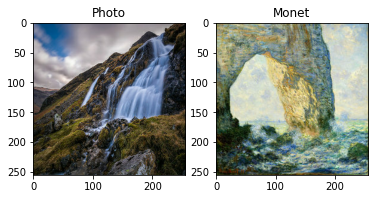

In [ ]:
monet_ds = load_dataset(MONET_PATHS, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_PATHS, labeled=True).batch(1)
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))

plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0] * 0.5 + 0.5)

##Baselining

For our baseline we decided to re-use the generator and discriminator code provided to us in the MNIST assginment. To make use of it we first need to resize our Monet-style paintings dataset to 32 by 32. 

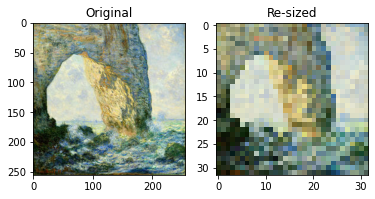

In [ ]:
# Defining our batch size
BATCH_SIZE = 256

# Resizing our dataset from 256*256 to 32*32
IMG_SIZE=32
resize = keras.layers.Resizing(IMG_SIZE,IMG_SIZE)
train_dataset = monet_ds.map(lambda x : resize(x))
sample = next(iter(train_dataset))

# Displaying image before resize
plt.subplot(121)
plt.title('Original')
plt.imshow(example_monet[0] * 0.5 + 0.5)

# Displaying an image after resizing
plt.subplot(122)
plt.title('Re-sized')
plt.imshow(sample[0] * 0.5 + 0.5)

As it can be appreciated, by scaling down the dataset some of the detail from the paintings is lost but we feel this to be a good starting point as we try to generate similar images. After running the code we obtain these images as our starting baseline and must improve on it.

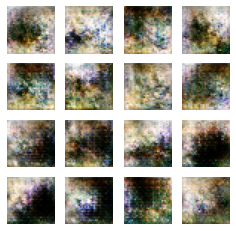

## Understanding the Data and Basic Data Analysis

In particular, we are using the 300 Monet paintings images sized 256x256 in TFRecord format when training the GAN. TFRecord format is a "simple format for storing a sequence of binary records" [3].

Trying to find a correlation between colors of the monet-style paintings could be helpfui when trying to build our models.

In [ ]:
# Function that displays random images from our dataset
def batch_visualization(path, n_images, is_random=True, figsize=(16, 16)):
    plt.figure(figsize=figsize)
    
    w = int(n_images ** .5)
    h = math.ceil(n_images / w)
    
    all_names = os.listdir(path)
    
    image_names = all_names[:n_images]
    if is_random:
        image_names = random.sample(all_names, n_images)
    
    for ind, image_name in enumerate(image_names):
        img = cv2.imread(os.path.join(path, image_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        plt.subplot(h, w, ind + 1)
        plt.imshow(img)
        plt.axis("off")
    
    plt.show()

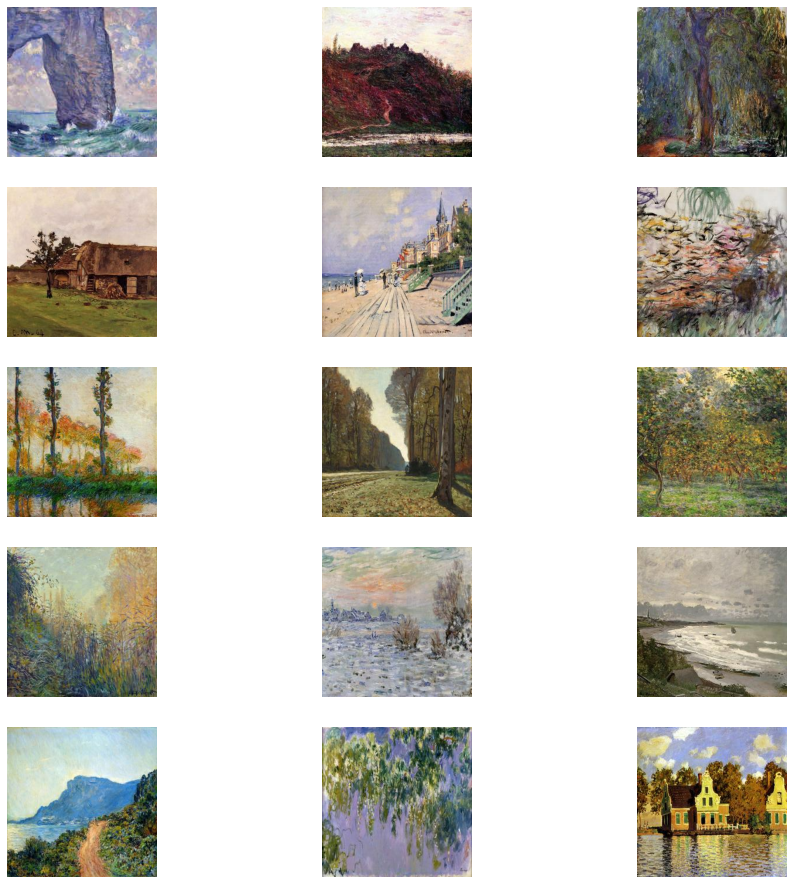

In [ ]:
# Viewing random images from our dataset
batch_visualization("monet_jpg/", 15)

In [ ]:
# Function that will display a histogram distribution of the colors of 
# a particular image in the dataset
def color_hist_visualization(image_path, figsize=(16, 4)):
    plt.figure(figsize=figsize)
    
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.axis("off")
    
    colors = ["red", "green", "blue"]
    for i in range(len(colors)):
        plt.subplot(1, 4, i + 2)
        plt.hist(
            img[:, :, i].reshape(-1),
            bins=25,
            alpha=0.5,
            color=colors[i],
            density=True
        )
        plt.xlim(0, 255)
        plt.xticks([])
        plt.yticks([])
    plt.show()

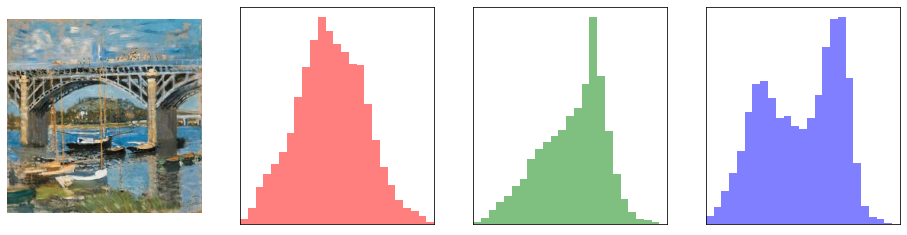

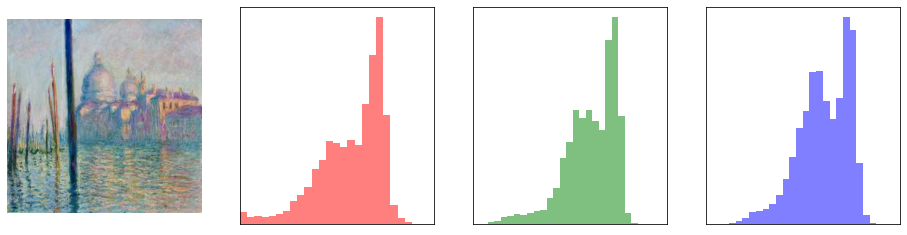

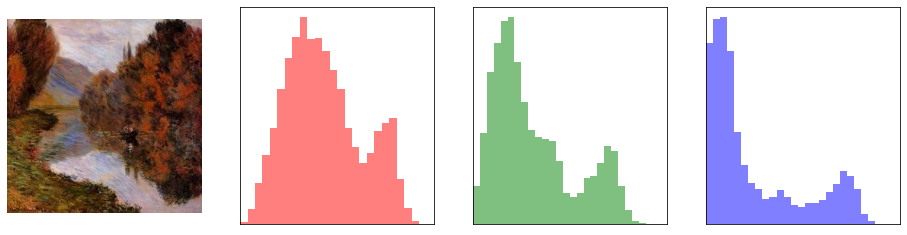

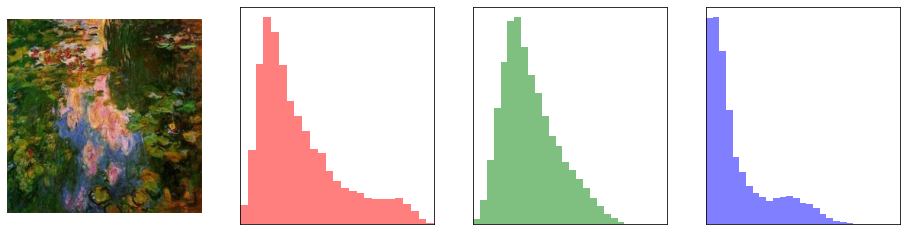

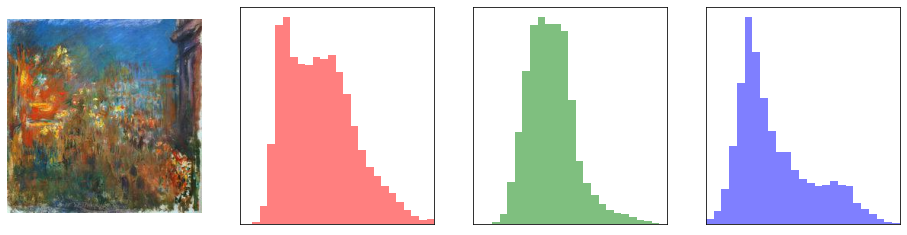

In [ ]:
# Visualizing the color distribution of some of the dataset images
color_hist_visualization("monet_jpg/10c555c1b1.jpg")
color_hist_visualization("monet_jpg/19dc36ccb2.jpg")
color_hist_visualization("monet_jpg/b3adc75e7d.jpg")
color_hist_visualization("monet_jpg/f7836c88eb.jpg")
color_hist_visualization("monet_jpg/d4116437bb.jpg")

## Create the DCGAN

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 28x28x1. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256,)))
    assert model.output_shape == (None, 8, 8, 256)  # Note: None is the batch size

    # Conv2DTranspose "undoes" the convolution (Opposite of convolution)
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    print(model.output_shape)
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    print(model.output_shape)
    assert model.output_shape == (None, 32, 32, 3)

    return model

Use the (as yet untrained) generator to create an image.

(None, 16, 16, 64)
(None, 32, 32, 3)


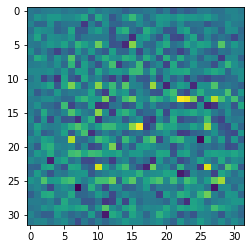

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

### The Discriminator

The discriminator is a CNN-based image classifier.

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(3))

    return model

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00245849 0.00277059 0.00136133]], shape=(1, 3), dtype=float32)


## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [ ]:
def discriminator_loss(real_output, fake_output):
    # We want all the values to be close to 1
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    # We want all the values to be close to 0
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since you will train two networks separately.

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop


In [ ]:
EPOCHS = 100
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function

# Passign the real images
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      # Fake images
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

**Generate and save images**


In [ ]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      img = predictions[i]

      _min = np.amin(img)
      _max = np.amax(img)
      img_norm = (img - _min) * 255.0 / (_max - _min)
      img_norm = np.uint8(img_norm)

      plt.imshow(img_norm)
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated digits will look increasingly real. After about 50 epochs, they resemble MNIST digits. This may take about one minute / epoch with the default settings on Colab.

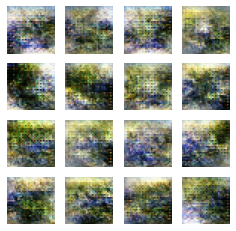

In [ ]:
train(train_dataset, EPOCHS)

Restore the latest checkpoint.

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Create a GIF


In [ ]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

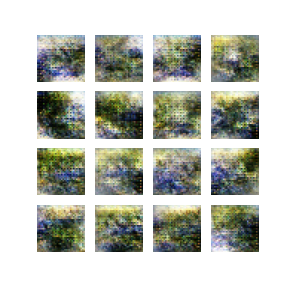

In [ ]:
display_image(EPOCHS)

Use `imageio` to create an animated gif using the images saved during training.

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


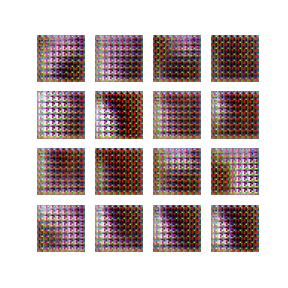

In [ ]:
embed.embed_file(anim_file)

##Results

Trying to improve results on our created GAN proved to be a challenge, commonly running into problems such as our session creashing when trying to generate larger images. When refining our generator and discriminator, only small changes seemed to be the result on our generated images as can be appreaciated on our end model. With this in our minds, we decided to shift our focus into attempting to look at pretrained NNs and starting ahead from where we were before.

#Neural Style Transfer


![](https://drive.google.com/uc?export=view&id=1rFnx9UkgrFvwgVT2JNxMR8RGuMhi6h_w)

>Neural Style Transfer (NST) refers to a class of software algorithms that manipulate digital images, or videos, in order to adopt the appearance or visual style of another image. NST algorithms are characterized by their use of deep neural networks for the sake of image transformation. Common uses for NST are the creation of artificial artwork from photographs, for example by transferring the appearance of famous paintings to user-supplied photographs. Several notable mobile apps use NST techniques for this purpose, including DeepArt and Prisma. This method has been used by artists and designers around the globe to develop new artwork based on existent style(s). [6]

Style transfer means that when a content image and a style image are given, the outline and shape of the image are similar to the content image, and the color or texture is changed to be similar to the style image.

By separating content and style, you can mix content and style of different images. Instead of trying to generate images from a latent vector that is filled with noise, here we try to copy the style from the monet style paintings to our photographs.

**Notice:** run the cell where the kaggle dataset for the competition is loaded before running the following cells.



In [ ]:
# import resources
%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import os, random

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

##Load the Pre-Trained Model

A pre-trained VGG19 Net is used as a model to extract content and style. It then uses the losses of the content and style to iteratively update the target image until the desired result is achieved.

VGG19 is divided into two parts:

* vgg19.features: All convolutional layers and pooling layers.
* vgg19.classifier: The last three linear layers are the classifier layer.

We only need the features part. And "freeze" so that the weight is not updated.

In [ ]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [ ]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

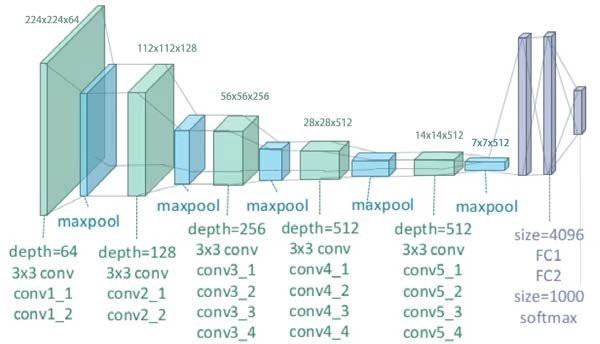

## Load Content and Style Images

Load the content image and style image to be used for style transfer. The load_image function transforms the image and loads it in the form of normalized Tensors.

In [ ]:
""" Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims."""

def load_image(img_path, max_size=128, shape=None):
    
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

For this project we will use our normal photo images as our **"content"** and the monet paintings as our **"style"**. 

Our session will crash if trying to load all of our photo images. For this example, only one image from each dataset will be taken. 

In [ ]:
# load in content and style image randomly and resize style to match content.
rand_content = random.choice(os.listdir("photo_jpg/"))
rand_style = random.choice(os.listdir("monet_jpg/"))

content = load_image("photo_jpg/"+rand_content).to(device) # normal photo
style = load_image("monet_jpg/"+rand_style).to(device) # monet-style image

In [ ]:
""" helper function for un-normalizing an image and converting it from a 
 Tensor image to a NumPy image for display, this helps when trying
 to use images outside of the the kaggle competition as it comes with Tensors
 for each image. """
def im_convert(tensor):
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

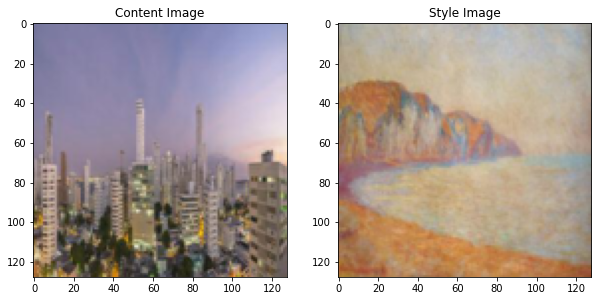

In [ ]:
# content and style ims side-by-side that will be worked on
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.title.set_text('Content Image')
ax1.imshow(im_convert(content))

ax2.title.set_text('Style Image')
ax2.imshow(im_convert(style))

In [ ]:
# Run an image forward through a model and get the features for a set of layers.
def get_features(image, model, layers=None):
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',
                  '28': 'conv5_1'}    
    features = {}
    x = image

    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

##Gram Matrix

![](https://drive.google.com/uc?export=view&id=1KRg6wvHIHbIrnDbYoZ0cpryRgdHie70K)

>The matrix expressing the correlation of this Channel is called Gram Matrix. Loss is minimized by defining the difference between this Gram Matrix and the Gram Matrix of the newly created image as a Loss Function. Next, in order to reflect the content, the loss function is calculated in units of pixels from the feature map spit out from each pre-trained CNN. In this way, a new image is created that minimizes the Loss calculated from Style and Loss calculated from Content. [7]

In [ ]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor         
    """
    
    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()
    
    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)
    
    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

The function that extracts the features of a given convolutional layer and computes the Gram Matrix is made. Putting it all together, we extract the features from the image and compute the Gram Matrix for each layer from the style representation.

In [ ]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start off with the target as a copy of our *content* image
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)

##Define Losses and Weights

**Individual Layer Style Weights**

You can give the option to weight the style expression in each relevant layer. It is recommended that the layer weight range from 0 to 1. By giving more weight to conv1_1 and conv2_1, more style artifacts can be reflected in the final target image.

**Content and Style Weight**

Define alpha (content_weight) and beta (style_weight). This ratio affects the style of the final image. It is recommended to leave content_weight = 1 and set style_weight to achieve the desired ratio.

In [ ]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e3  # beta

##Update Target and Calculate Losses

**Content Loss**

The content loss is calculated as the MSE between the target and the content feature in the 'conv4_2' layer.

**Style Loss**

The style loss is the loss between the target image and the style image. That is, it refers to the difference between the gram matrix of the style image and the gram matrix of the target image. Loss is calculated using MSE

**Total Loss**

Finally, the total loss is calculated by summing the style and content losses and weighting them with the specified alpha and beta.

Total loss:  279.8842468261719


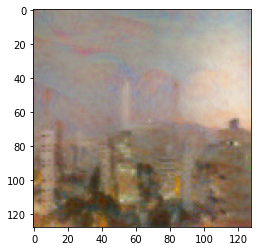

Total loss:  117.5166015625


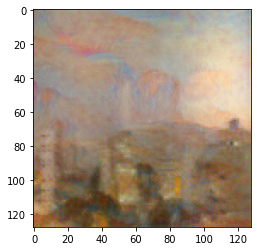

Total loss:  81.11577606201172


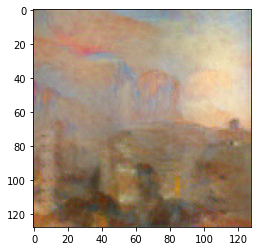

Total loss:  64.23220825195312


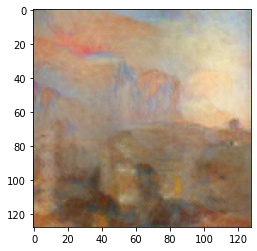

Total loss:  53.994197845458984


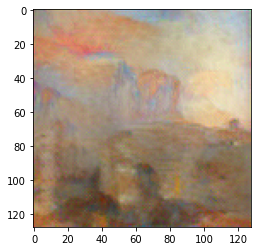

Total loss:  47.14204406738281


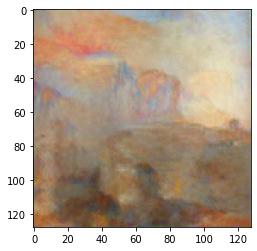

Total loss:  42.282379150390625


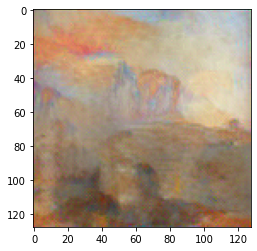

Total loss:  38.446773529052734


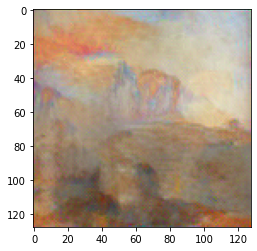

Total loss:  35.346351623535156


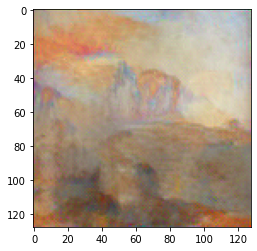

Total loss:  32.62055206298828


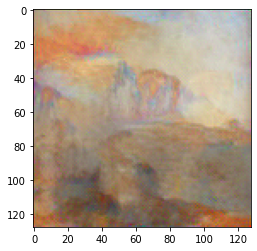

In [ ]:
# for displaying the target image, intermittently
show_every = 500
dp_count = 0

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 5001  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features = get_features(target, vgg)
    
    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)
        
    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.savefig('transfer_at_display_{:04d}.png'.format(dp_count))
        dp_count = dp_count + 1
        plt.show()

Animate results and display them alongside the original content and style images.

In [ ]:
anim_file_NST = 'NST.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('transfer*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

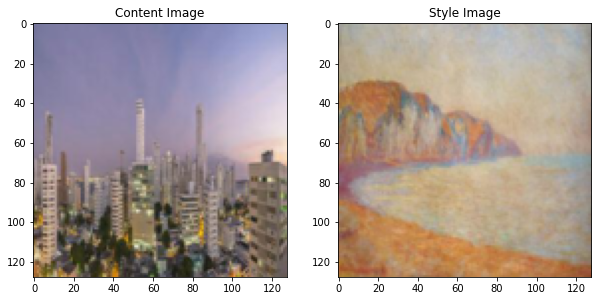

In [ ]:
# content and style ims side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.title.set_text('Content Image')
ax1.imshow(im_convert(content))

ax2.title.set_text('Style Image')
ax2.imshow(im_convert(style))


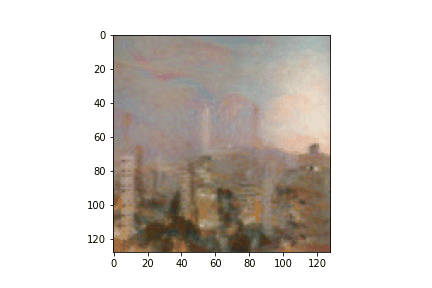

In [ ]:
# results gif
embed.embed_file(anim_file_NST)

# Cycle GAN

[Cycle Generative Adversarial Network](https://junyanz.github.io/CycleGAN/) (Cycle GANs) is an approach to training a deep convolutional neural network for image-to-image translation tasks. This means the network learns to map inout and output images using unpaired dataset. However, a Cycle GAN is composed of 2 GANS making it a total of 2 generators and 1 discriminator. In the picture below, one generator would be in charge of transforming horses into zebras while the other transforms zebras into horses. Just like a regular GAN, the descriminators will check if the images generated by the generators appear to be real or fake. One of the advantages of a Cycle GAN is that each generator obtains additional feedback from one another or is "cycle consistent [5]." It is important to note that both generators will get penalized for every detail that isn't similar to the original image when making these image translations.

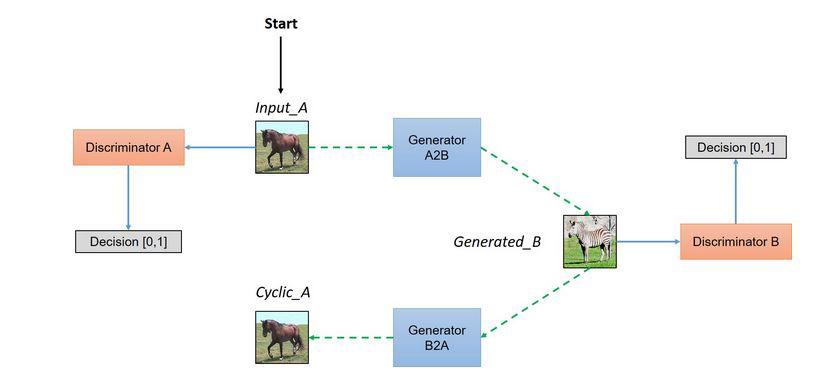

# Self-Supervised Task + Self-Supervised GANs

Recall that GANs are some kind of form of **unsupervised** model since we can simply provide data **WITHOUT LABELS** and have the model create synthetic data from it. 


Often, we have huge image datasets which makes labeling **VERY EXPENSIVE** and we can't possibly label it ourselves manually.
<br><br>
**Self-Supervised tasks for GANs can include [9]:**
* Image colorization
* Predicting the relative location of extracted patches from an image
* Predicting the rotation angle of an image

For this project, we will attempt the *Auxiliary Rotation Task* pictured by the following figure:
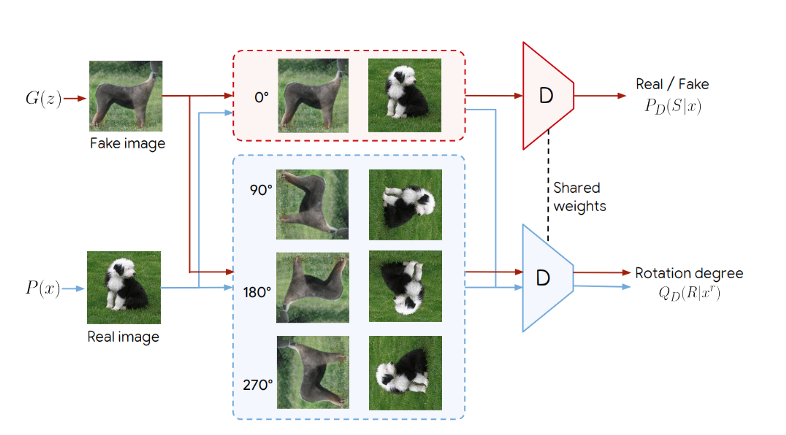

The primary idea is to have the **generator** be completely unaware of the auxiliary rotation task. Its task is that it must *learn to produce images which share similar characteristics to the real images when rotated*.

On the other hand, the **discriminator** now has the following two tasks:
* 1. Prdict wether the images came from the original training set or were created by the generator 
* 2. Classify the rotation angle of the images (0, 90, 180, 270)

The discriminator’s rotation error is **ONLY** penalized on the error on **REAL IMAGES** to discourage unhealthy convergence from the generator.

This is known as **COLLABORATIVE ADVERSARIAL LEARNING** because even though they are adversarial for the real or fake task, it is in the best interest for the generator to create images that the discriminator can succesfully classify the rotation angle!

## Catastrophic Forgetting in GANs

Two most common issues in GANs are 1) mode collapse and 2) catastrophic forgetting. The picture below shows how adding a self-supervised learning task could help stabilize the GAN.

Example) Say we train a model with 10 distinct classes to classify one vs all the rest of the classes, then swtich class at each step. #1) class 1 vs rest, class 2 vs rest, class 3 vs rest etc. ... 

At each iteration, we experience a huge downward fall (forgets the representation). Adding a SS task helps.

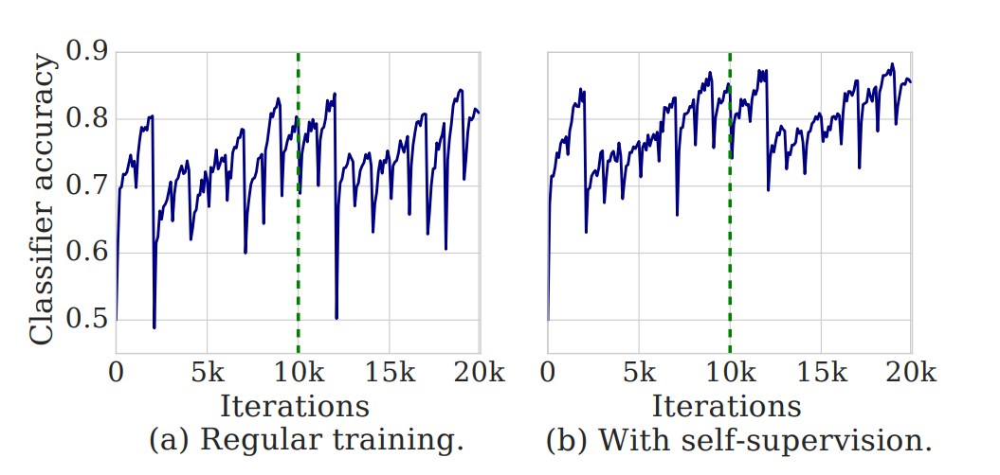

# Conclusion

This particular dataset presented us with various types of challenges. The first challenge we encountered was to find a way to utilize files formatted as TFRecords. Given that it was the first time we had heard of such format, we did research and found out that a TFRecord is a "simple format for storing a sequence of binary records." After digging through examples, we quickly found a way to obtain our dataset. 





Keeeping in mind that the primary goal of this project was to generate Monet style images, we established that we were to use Generative Adversarial Networks or GANs to meet the objective. However, as we built our network, we realized that the inputs and outputs of each layer would be extremely large given that each image in our dataset are of size 256x256. This would eventually lead to long training times. We decided to scale down our images to 32x32 at the cost of our image resolution for faster and more feasible running times. It was after that when we were able to generate our first images with our DCGAN. 

Although our DCGAN did generate images with relavant features to that of Monet style images, we ventured off to look for new techniques that could improve our generated paintings. After more research, we ran into the concept of Neural Style Transfer. The primary idea of NST algorithms are to manipulate digital images, or videos, in order to adopt the appearance or visual style of another image. In our case, have pictures with a Monet style "filter." For this, we decided use a pre-trainied called VGG19. This convolutional neural network is compromised of 19 layers with 16 convolutional layers and 3 fully connected proposed by Simonyan and Zisserman in 2014. We took the features of the VGG19 neural network and applied them using a gram matrix.

The last concept that we visited was that of Cycle Generative Adversarial Network or Cycle GANs for short. The central idea of a Cycle GAN is that each of the two generators will receive more feedback for each image generated. This is to ensure that that each generator is "cycle consistent." According to a research paper by Stanford, if we were to combine the pretrained VGG19 convolutional neural network and Cycle GAN, the resulting images would be great [8]. However, we did no have enough time to implement it ourselves but the idea seems promising.

Overall, this project allowed us to apply various new skills that we have obtained thus far in this course, in particular, image generation. We learned how to apply ideas learned in class and apply them to a dataset of our choice. 

# References



*   [1] Jang, A. (2020, August 29). Monet Cyclegan Tutorial. Kaggle. Retrieved October 25, 2022, from https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook 
* [2] Peakwhisky. (2022, October 7). Monet DCGAN. Kaggle. Retrieved October 25, 2022, from https://www.kaggle.com/code/peakwhisky/monet-dcgan 
* [3] TFRecord and tf.train.example &nbsp;: &nbsp; Tensorflow Core. TensorFlow. (n.d.). Retrieved October 25, 2022, from https://www.tensorflow.org/tutorials/load_data/tfrecord#:~:text=The%20TFRecord%20format%20is%20a,to%20understand%20a%20message%20type
* [4] Ihelon. (2020, December 4). Monet - visualization and augmentation. Kaggle. Retrieved October 25, 2022, from https://www.kaggle.com/code/ihelon/monet-visualization-and-augmentation 
* [5] Overview of cyclegan architecture and training. (n.d.). Retrieved November 2, 2022, from https://towardsdatascience.com/overview-of-cyclegan-architecture-and-training-afee31612a2f 
* [6] Neural style transfer. Retrieved November 1, 2022, from https://en.wikipedia.org/wiki/Neural_style_transfer
* [7] Gram matrix. Retrieved November 1, 2022, from https://en.wikipedia.org/wiki/Gram_matrix
* [8] Stanford University. (n.d.). Retrieved November 3, 2022, from http://cs230.stanford.edu/projects_fall_2020/reports/55792990.pdf 
* [9] Shorten, C. (2019, April 14). Self-supervised Gans. Medium. Retrieved November 27, 2022, from https://towardsdatascience.com/self-supervised-gans-2aec1eadaccd#:~:text=Self%2DSupervised%20tasks%20include%20things,itself%20to%20these%20surrogate%20tasks. 
* [10] Self-Supervised GANs via Auxiliary Rotation Loss. Retrieved November 27, 2022, from https://arxiv.org/pdf/1811.11212.pdf.

